# Travaux pratiques N° 1 : *Machine Learning pour le contrôle de qualité*
par Gilbert HABA et Joseph OGODJA

## Objectif
L’objectif de ce TP est de développer un modèle de classification pour le contrôle qualité des puces
semi-conductrices.

## Description des données (dataset)
Soit le dataset “SECOM-Detecting-Defected-Items”. Le dataset SECOM-Detecting-DefectedItems vise à détecter les puces semi-conductrices défectueuses durant le processus de fabrication.
Il s’agit d’un problème de classification binaire où l’objectif est de prédire si une puce est
défectueuse ou non en considérant. Le dataset contient 590 attributs représentants les mesures de
différents capteurs durant le processus de fabrication

## Installation et importation des modules nécessaires au code

In [37]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import (confusion_matrix, accuracy_score, precision_score,
                             recall_score, f1_score, roc_curve, auc, r2_score)
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
import joblib
import random

## 2.1. Pré-traitement de données

### 1. Chargement du ficher CSV

In [38]:
# Chargement du fichier CSV
df = pd.read_csv("/content/uci-secom.csv")

display(df)

,Time,0,1,2,3,4,5,6,7,8,...,582,583,584,585,586,587,588,589,Phase,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,Gravure,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,Lithographie,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,Métallisation,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,Test électrique,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,Implantation ionique,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,2899.41,2464.36,2179.7333,3085.3781,1.4843,100.0,82.2467,0.1248,1.3424,...,0.4988,0.0143,0.0039,2.8669,0.0068,0.0138,0.0047,203.1720,Gravure,-1
1563,2008-10-16 20:49:00,3052.31,2522.55,2198.5667,1124.6595,0.8763,100.0,98.4689,0.1205,1.4333,...,0.4975,0.0131,0.0036,2.6238,0.0068,0.0138,0.0047,203.1720,Lithographie,-1
1564,2008-10-17 05:26:00,2978.81,2379.78,2206.3000,1110.4967,0.8236,100.0,99.4122,0.1208,NaN,...,0.4987,0.0153,0.0041,3.0590,0.0197,0.0086,0.0025,43.5231,Dépôt de couches minces,-1
1565,2008-10-17 06:01:00,2894.92,2532.01,2177.0333,1183.7287,1.5726,100.0,98.7978,0.1213,1.4622,...,0.5004,0.0178,0.0038,3.5662,0.0262,0.0245,0.0075,93.4941,Métallisation,-1


### 2. Dimension du dataframe

In [39]:
print(df.shape)

(1567, 593)


### 3. Affichage des 10 premières lignes du dataframe

In [40]:
display(df.head(10))

,Time,0,1,2,3,4,5,6,7,8,...,582,583,584,585,586,587,588,589,Phase,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,Gravure,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,Lithographie,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,Métallisation,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,Test électrique,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,Implantation ionique,-1
5,2008-07-19 17:53:00,2946.25,2432.84,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5287,...,0.4949,0.0189,0.0044,3.8276,0.0342,0.0151,0.0052,44.0077,Gravure,-1
6,2008-07-19 19:44:00,3030.27,2430.12,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.5816,...,0.5010,0.0143,0.0042,2.8515,0.0342,0.0151,0.0052,44.0077,Dépôt de couches minces,-1
7,2008-07-19 19:45:00,3058.88,2690.15,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5153,...,0.4984,0.0106,0.0034,2.1261,0.0204,0.0194,0.0063,95.0310,Gravure,-1
8,2008-07-19 20:24:00,2967.68,2600.47,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5358,...,0.4993,0.0172,0.0046,3.4456,0.0111,0.0124,0.0045,111.6525,Test électrique,-1
9,2008-07-19 21:35:00,3016.11,2428.37,2248.9000,1004.4692,0.7884,100.0,106.2400,0.1185,1.5381,...,0.4967,0.0152,0.0038,3.0687,0.0212,0.0191,0.0073,90.2294,Implantation ionique,-1


### 4. Utilisation de la méthode info() pour afficher les détails des colonnes

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 593 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(2)
memory usage: 7.1+ MB


### 4. Utiliser la méthode describe() pour afficher quelques statistiques

In [42]:
display(df.describe())

,0,1,2,3,4,5,6,7,8,9,...,581,582,583,584,585,586,587,588,589,Pass/Fail
count,1561.000000,1560.000000,1553.000000,1553.000000,1553.000000,1553.0,1553.000000,1558.000000,1565.000000,1565.000000,...,618.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1567.000000
mean,3014.452896,2495.850231,2200.547318,1396.376627,4.197013,100.0,101.112908,0.121822,1.462862,-0.000841,...,97.934373,0.500096,0.015318,0.003847,3.067826,0.021458,0.016475,0.005283,99.670066,-0.867262
std,73.621787,80.407705,29.513152,441.691640,56.355540,0.0,6.237214,0.008961,0.073897,0.015116,...,87.520966,0.003404,0.017180,0.003720,3.578033,0.012358,0.008808,0.002867,93.891919,0.498010
min,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,-0.053400,...,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000,-1.000000
25%,2966.260000,2452.247500,2181.044400,1081.875800,1.017700,100.0,97.920000,0.121100,1.411200,-0.010800,...,46.184900,0.497900,0.011600,0.003100,2.306500,0.013425,0.010600,0.003300,44.368600,-1.000000
50%,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,-0.001300,...,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500,-1.000000
75%,3056.650000,2538.822500,2218.055500,1591.223500,1.525700,100.0,104.586700,0.123800,1.516900,0.008400,...,116.539150,0.502375,0.016500,0.004100,3.295175,0.027600,0.020300,0.006400,114.749700,-1.000000
max,3356.350000,2846.440000,2315.266700,3715.041700,1114.536600,100.0,129.252200,0.128600,1.656400,0.074900,...,737.304800,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800,1.000000


## 2.2. Analyze de données

### 2.2.1. Vérification du type de données de différentes colonnes

In [43]:
print("Types de données des colonnes :")
print(df.dtypes)

print("\n")

# Afficher le nombre de colonnes par type de données
type_counts = df.dtypes.value_counts()
print("Nombre de colonnes par type de données :")
for dtype, count in type_counts.items():
    print(f"{dtype}: {count} colonnes")


Types de données des colonnes :
Time          object
0            float64
1            float64
2            float64
3            float64
              ...   
587          float64
588          float64
589          float64
Phase         object
Pass/Fail      int64
Length: 593, dtype: object


Nombre de colonnes par type de données :
float64: 590 colonnes
object: 2 colonnes
int64: 1 colonnes


### 2.2.2 Opérations de prétraitement

#### 2.2.2.1 Suppression des données manquantes

#### Affichage du pourcentage Pass/Fail

In [45]:
def pourcentage_target(dataframe_cible):
  print("Taille dataframe : ")
  print(df.shape)
  if 'Pass/Fail' in df.columns:
    pass_fail_counts = df['Pass/Fail'].value_counts(normalize=True) * 100
    print("\nRépartition des valeurs de 'Pass/Fail' en pourcentage:")
    for value, pct in pass_fail_counts.items():
        print(f"{value}: {pct:.2f}%")
  else:
    print("\nLa colonne 'Pass/Fail' n'existe pas dans le dataset.")

pourcentage_target(df)

Taille dataframe : 
(1567, 593)

Répartition des valeurs de 'Pass/Fail' en pourcentage:
-1: 93.36%
1: 6.64%


#### Affichage des pourcentages de données manquantes par colonnes

In [46]:
# Afficher les colonnes avec des valeurs manquantes et leur pourcentage
missing_values = df.isnull().sum()
missing_percent = (missing_values / len(df)) * 100
missing_data = missing_values[missing_values > 0].sort_values(ascending=False)
missing_percent = missing_percent[missing_percent > 0].sort_values(ascending=False)

if not missing_data.empty:
    print("Colonnes avec des valeurs manquantes :")
    for col, pct in zip(missing_data.index, missing_percent):
        print(f"{col}: {missing_data[col]} valeurs manquantes ({pct:.2f}%)")
else:
    print("Aucune valeur manquante détectée.")

Colonnes avec des valeurs manquantes :
292: 1429 valeurs manquantes (91.19%)
157: 1429 valeurs manquantes (91.19%)
158: 1429 valeurs manquantes (91.19%)
293: 1429 valeurs manquantes (91.19%)
492: 1341 valeurs manquantes (85.58%)
220: 1341 valeurs manquantes (85.58%)
358: 1341 valeurs manquantes (85.58%)
85: 1341 valeurs manquantes (85.58%)
516: 1018 valeurs manquantes (64.96%)
517: 1018 valeurs manquantes (64.96%)
382: 1018 valeurs manquantes (64.96%)
111: 1018 valeurs manquantes (64.96%)
383: 1018 valeurs manquantes (64.96%)
384: 1018 valeurs manquantes (64.96%)
246: 1018 valeurs manquantes (64.96%)
244: 1018 valeurs manquantes (64.96%)
245: 1018 valeurs manquantes (64.96%)
110: 1018 valeurs manquantes (64.96%)
518: 1018 valeurs manquantes (64.96%)
109: 1018 valeurs manquantes (64.96%)
579: 949 valeurs manquantes (60.56%)
581: 949 valeurs manquantes (60.56%)
578: 949 valeurs manquantes (60.56%)
580: 949 valeurs manquantes (60.56%)
346: 794 valeurs manquantes (50.67%)
72: 794 valeurs m

#### Suppression des colonnes avec plus de 5% de valeurs manquantes

In [47]:
# Suppression des colonnes avec plus de 5% de valeurs manquantes
print("Taille avant suppression : ")
print(df.shape)

drop_cols = missing_percent[missing_percent > 5].index
df.drop(columns=drop_cols, inplace=True)
print(f"({len(drop_cols)}) colonnes supprimées car plus de 5% de valeurs manquantes: {list(drop_cols)}")

print("Taille après suppression : ")
print(df.shape)

pourcentage_target(df)

Taille avant suppression : 
(1567, 593)
(52) colonnes supprimées car plus de 5% de valeurs manquantes: ['292', '157', '158', '293', '492', '220', '358', '85', '516', '517', '382', '111', '383', '384', '246', '244', '245', '110', '518', '109', '579', '581', '578', '580', '346', '72', '73', '345', '247', '385', '112', '519', '567', '563', '562', '569', '566', '565', '568', '564', '546', '548', '547', '554', '553', '552', '551', '550', '549', '556', '555', '557']
Taille après suppression : 
(1567, 541)
Taille dataframe : 
(1567, 541)

Répartition des valeurs de 'Pass/Fail' en pourcentage:
-1: 93.36%
1: 6.64%


#### Affichage du pourcentage des lignes avec des donnnées manquantes

In [48]:
# Afficher le pourcentage de lignes contenant des valeurs manquantes
rows_with_nan = df.isnull().any(axis=1).sum()
total_rows = len(df)
percent_rows_with_nan = (rows_with_nan / total_rows) * 100
print(f"Pourcentage de lignes contenant des valeurs manquantes : {percent_rows_with_nan:.2f}%")

Pourcentage de lignes contenant des valeurs manquantes : 11.10%


#### Suppression des lignes avec au moins une donnée manquante

In [49]:
print("Taille avant suppression : ")
print(df.shape)

# Suppression des lignes avec au moins une valeur manquante
df.dropna(inplace=True)
print("Toutes les lignes contenant au moins une valeur manquante ont été supprimées.")

print("Taille après suppression : ")
print(df.shape)

pourcentage_target(df)

Taille avant suppression : 
(1567, 541)
Toutes les lignes contenant au moins une valeur manquante ont été supprimées.
Taille après suppression : 
(1393, 541)
Taille dataframe : 
(1393, 541)

Répartition des valeurs de 'Pass/Fail' en pourcentage:
-1: 92.89%
1: 7.11%


#### 2.2.2.2. Supression de tous les doublons

In [50]:
print("Taille avant suppression : ")
print(df.shape)

# Suppression des doublons
df.drop_duplicates(inplace=True)
print("Toutes les lignes contenant des doublons ont été supprimées.")

print("Taille après suppression : ")
print(df.shape)

pourcentage_target(df)

Taille avant suppression : 
(1393, 541)
Toutes les lignes contenant des doublons ont été supprimées.
Taille après suppression : 
(1393, 541)
Taille dataframe : 
(1393, 541)

Répartition des valeurs de 'Pass/Fail' en pourcentage:
-1: 92.89%
1: 7.11%


#### 2.2.2.3. Suppression des colonnes avec des valeurs nulles ou identiques

In [51]:
print("Taille avant suppression : ")
print(df.shape)

# Suppression des colonnes ayant des valeurs nulles ou identiques
cols_to_drop = [col for col in df.columns if df[col].nunique() <= 1]
df.drop(columns=cols_to_drop, inplace=True)
print(f"({len(cols_to_drop)}) colonnes supprimées car elles contenaient des valeurs nulles ou identiques: {cols_to_drop}")

print("Taille après suppression : ")
print(df.shape)

pourcentage_target(df)

Taille avant suppression : 
(1393, 541)
(116) colonnes supprimées car elles contenaient des valeurs nulles ou identiques: ['5', '13', '42', '49', '52', '69', '97', '141', '149', '178', '179', '186', '189', '190', '191', '192', '193', '194', '226', '229', '230', '231', '232', '233', '234', '235', '236', '237', '240', '241', '242', '243', '256', '257', '258', '259', '260', '261', '262', '263', '264', '265', '266', '276', '284', '313', '314', '315', '322', '325', '326', '327', '328', '329', '330', '364', '369', '370', '371', '372', '373', '374', '375', '378', '379', '380', '381', '394', '395', '396', '397', '398', '399', '400', '401', '402', '403', '404', '414', '422', '449', '450', '451', '458', '461', '462', '463', '464', '465', '466', '481', '498', '501', '502', '503', '504', '505', '506', '507', '508', '509', '512', '513', '514', '515', '528', '529', '530', '531', '532', '533', '534', '535', '536', '537', '538']
Taille après suppression : 
(1393, 425)
Taille dataframe : 
(1393, 425)



### 2.2.3. Supression de la colonne "Time"

In [52]:
# 7. Supprimer la colonne "Time" si elle existe
df.drop(columns=['Time'], errors='ignore', inplace=True)

display(df)

,0,1,2,3,4,6,7,8,9,10,...,582,583,584,585,586,587,588,589,Phase,Pass/Fail
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,...,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,Lithographie,-1
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,0.0013,...,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,Métallisation,1
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,-0.0033,...,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,Test électrique,-1
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,-0.0072,...,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,Implantation ionique,-1
5,2946.25,2432.84,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5287,0.0167,0.0055,...,0.4949,0.0189,0.0044,3.8276,0.0342,0.0151,0.0052,44.0077,Gravure,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1537,3006.22,2525.20,2192.7889,1268.5852,1.9935,104.5867,0.1268,1.4522,-0.0039,-0.0075,...,0.4942,0.0175,0.0045,3.5322,0.0199,0.0097,0.0037,48.7045,Métallisation,-1
1539,2908.94,2560.99,2187.3444,2882.8558,1.5876,85.4189,0.1235,1.4167,0.0041,-0.0056,...,0.4987,0.0118,0.0028,2.3583,0.0237,0.0112,0.0038,47.3376,Métallisation,-1
1540,2996.04,2555.92,2190.7666,3530.2362,0.8017,83.8767,0.1249,1.4158,-0.0029,0.0000,...,0.5011,0.0163,0.0035,3.2608,0.0181,0.0123,0.0046,67.6676,Dépôt de couches minces,-1
1541,3246.31,2499.79,2216.8111,1190.4067,2.5148,114.5533,0.1230,1.3966,-0.0057,-0.0169,...,0.5021,0.0103,0.0030,2.0418,0.0266,0.0063,0.0019,23.5979,Métallisation,-1


#### 2.2.2.4. Encodage de la colonne "Phase"

In [53]:
# Encodage des variables catégoriques
label_encoders = {}
for col in df.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

display(df)

,0,1,2,3,4,6,7,8,9,10,...,582,583,584,585,586,587,588,589,Phase,Pass/Fail
1,3095.78,2465.14,2230.4222,1463.6606,0.8294,102.3433,0.1247,1.4966,-0.0005,-0.0148,...,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,3,-1
2,2932.61,2559.94,2186.4111,1698.0172,1.5102,95.4878,0.1241,1.4436,0.0041,0.0013,...,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,4,1
3,2988.72,2479.90,2199.0333,909.7926,1.3204,104.2367,0.1217,1.4882,-0.0124,-0.0033,...,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,5,-1
4,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5031,-0.0031,-0.0072,...,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,2,-1
5,2946.25,2432.84,2233.3667,1326.5200,1.5334,100.3967,0.1235,1.5287,0.0167,0.0055,...,0.4949,0.0189,0.0044,3.8276,0.0342,0.0151,0.0052,44.0077,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1537,3006.22,2525.20,2192.7889,1268.5852,1.9935,104.5867,0.1268,1.4522,-0.0039,-0.0075,...,0.4942,0.0175,0.0045,3.5322,0.0199,0.0097,0.0037,48.7045,4,-1
1539,2908.94,2560.99,2187.3444,2882.8558,1.5876,85.4189,0.1235,1.4167,0.0041,-0.0056,...,0.4987,0.0118,0.0028,2.3583,0.0237,0.0112,0.0038,47.3376,4,-1
1540,2996.04,2555.92,2190.7666,3530.2362,0.8017,83.8767,0.1249,1.4158,-0.0029,0.0000,...,0.5011,0.0163,0.0035,3.2608,0.0181,0.0123,0.0046,67.6676,0,-1
1541,3246.31,2499.79,2216.8111,1190.4067,2.5148,114.5533,0.1230,1.3966,-0.0057,-0.0169,...,0.5021,0.0103,0.0030,2.0418,0.0266,0.0063,0.0019,23.5979,4,-1


### 2.2.4. Analyses statistiques nécessaires

#### 2.2.4.1. Corrélation entre les variables

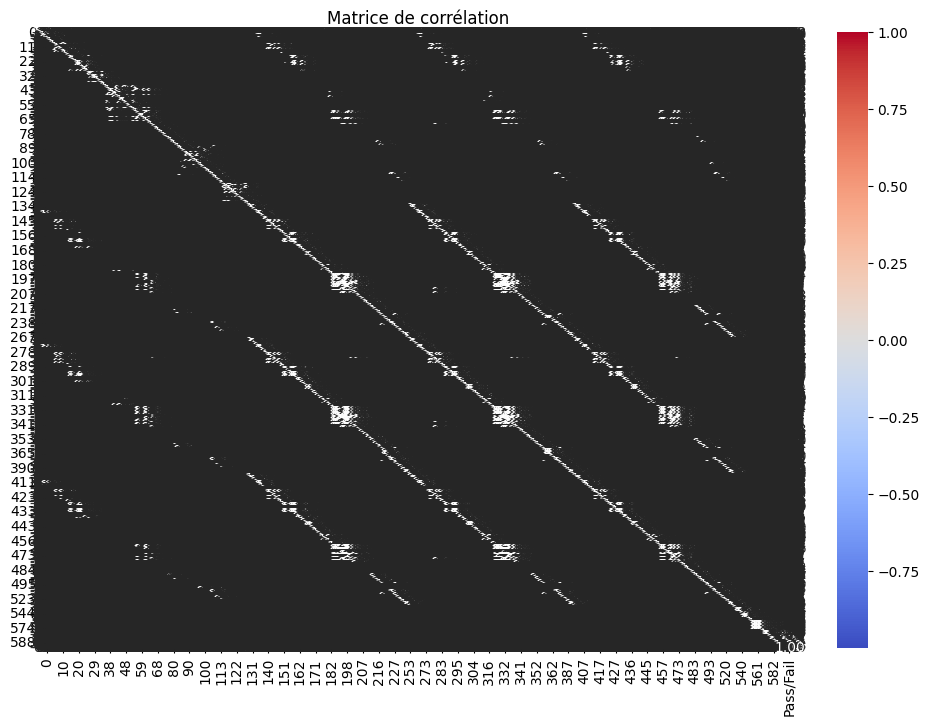

In [ ]:
# 8. Analyse statistique : Corrélation entre les variables
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Matrice de corrélation")
plt.show()

#### Retrait des colonnes avec une corrélation supérieure à 0.9

Colonnes supprimées : ['363', '365', '182', '587', '428', '332', '431', '308', '136', '290', '324', '341', '106', '93', '545', '435', '215', '440', '561', '201', '27', '522', '359', '279', '267', '291', '207', '523', '161', '183', '389', '351', '156', '105', '427', '336', '342', '588', '387', '104', '490', '224', '301', '135', '576', '331', '333', '350', '309', '524', '393', '145', '170', '164', '94', '416', '445', '7', '520', '436', '366', '154', '239', '477', '302', '391', '273', '307', '171', '197', '352', '467', '92', '150', '441', '168', '203', '559', '281', '140', '491', '495', '249', '470', '349', '208', '390', '137', '151', '278', '204', '271', '4', '388', '494', '584', '409', '447', '525', '25', '459', '74', '275', '410', '153', '185', '142', '34', '471', '300', '147', '173', '526', '202', '211', '377', '187', '228', '320', '443', '269', '299', '539', '177', '282', '347', '296', '304', '454', '585', '238', '212', '392', '114', '310', '406', '323', '67', '166', '127', '222', '2

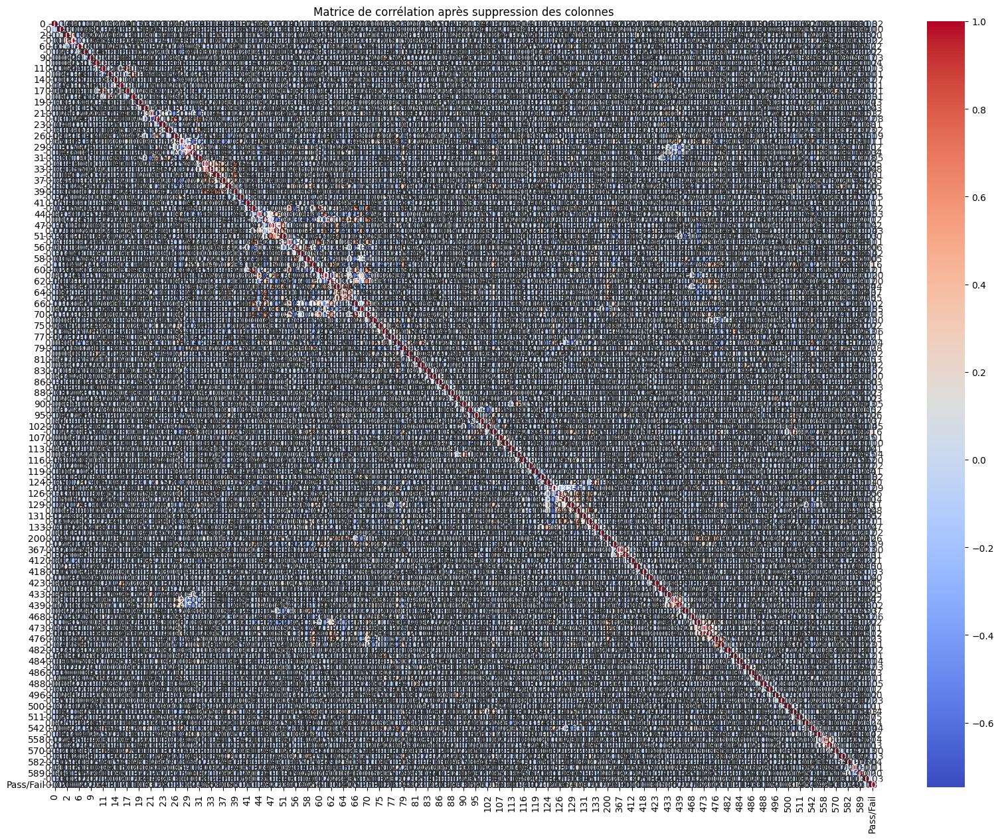

In [55]:
# Calculer la matrice de corrélation
corr_matrix = df.corr()

# Trouver les indices des colonnes avec une corrélation supérieure à 0.9
upper_triangle = corr_matrix.where(abs(corr_matrix) > 0.9).stack().index.tolist()

# Créer une liste de colonnes à supprimer
columns_to_drop = set()
for col1, col2 in upper_triangle:
    if col1 != col2:  # Si ce ne sont pas la même colonne
        columns_to_drop.add(col2)

# Affichage des colonnes supprimées
columns_to_drop = list(columns_to_drop)
print("Colonnes supprimées :", columns_to_drop)

# Supprimer les colonnes avec une corrélation supérieure à 0.9
df_cleaned = df.drop(columns=columns_to_drop)

# Affichage de la nouvelle matrice de corrélation
plt.figure(figsize=(20, 15))
sns.heatmap(df_cleaned.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Matrice de corrélation après suppression des colonnes")
plt.show()

#### Taille du nouveau dataframe

In [56]:
display(df_cleaned.shape)

(1393, 137)

#### Retrait des colonnes avec une corrélation supérieure à 0.8

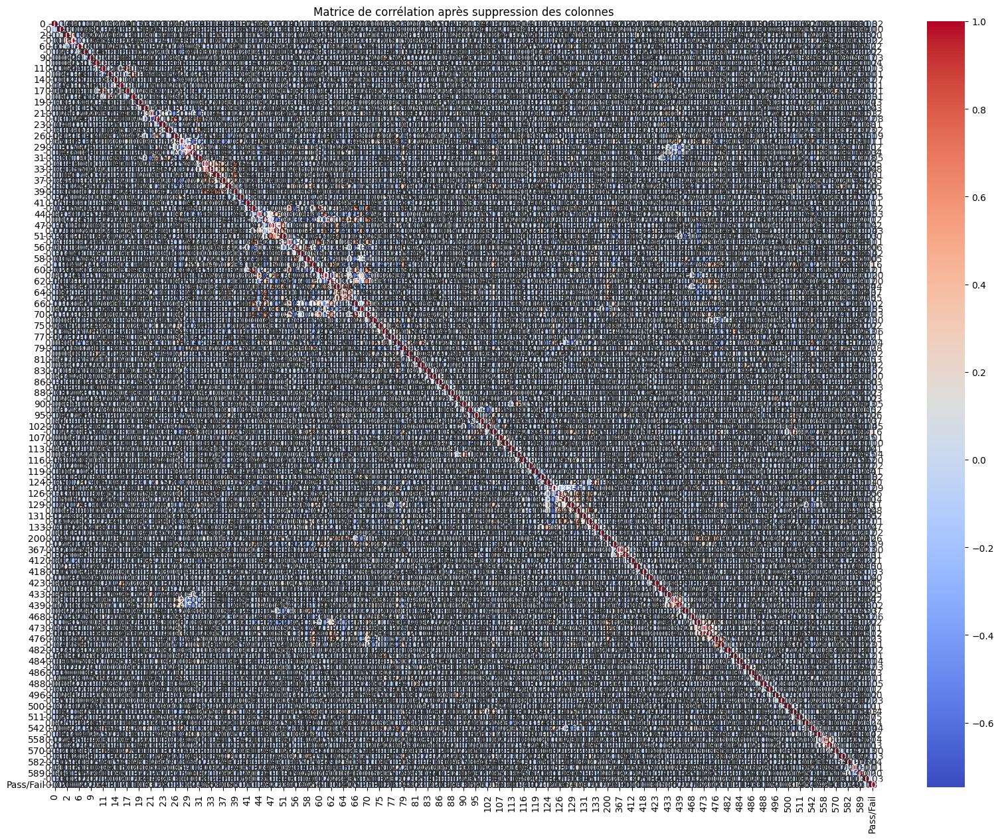

In [58]:
df_80 = df_cleaned
# Calculer la matrice de corrélation
corr_matrix = df_80.corr()

# Trouver les indices des colonnes avec une corrélation supérieure à 0.9
upper_triangle = corr_matrix.where(abs(corr_matrix) > 0.9).stack().index.tolist()

# Créer une liste de colonnes à supprimer
columns_to_drop = []
for col1, col2 in upper_triangle:
    if col1 != col2:  # Si ce ne sont pas la même colonne
        columns_to_drop.append(col2)

# Supprimer les colonnes avec une corrélation supérieure à 0.9
df_cleaned_80 = df_80.drop(columns=columns_to_drop)

# Affichage de la nouvelle matrice de corrélation
plt.figure(figsize=(20, 15))
sns.heatmap(df_cleaned_80.corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Matrice de corrélation après suppression des colonnes")
plt.show()


#### Taille du nouveau dataframe ainsi créé

In [62]:
display(df_cleaned_80.shape)

(1393, 137)

#### Détection de valeurs aberrantes avec boxplot

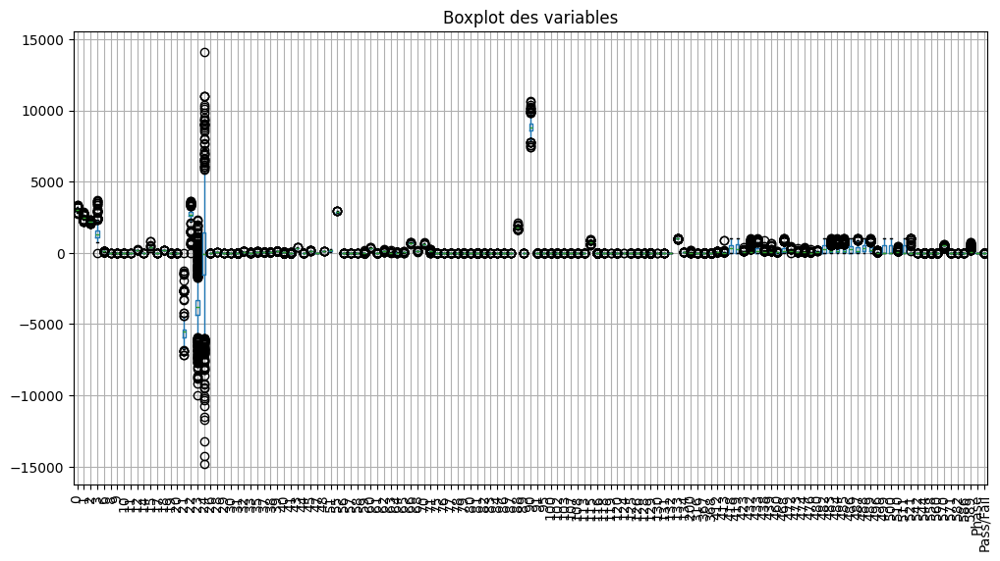

In [63]:
# Détection des valeurs aberrantes avec boxplot
plt.figure(figsize=(12, 6))
df_cleaned.boxplot(rot=90)
plt.title("Boxplot des variables")
plt.show()

#### Retrait de valeur aberrante au dela de l'intervalle [-5000; 5000]

In [64]:
# Définir les seuils pour les valeurs aberrantes
upper_limit = 5000
lower_limit = -5000

# Identifier les colonnes contenant des valeurs aberrantes
columns_to_drop = []
for col in df_cleaned.columns:
    if (df_cleaned[col] > upper_limit).any() or (df_cleaned[col] < lower_limit).any():
        columns_to_drop.append(col)

# Supprimer les colonnes contenant des valeurs aberrantes
df_cleaned_no_outliers = df_cleaned.drop(columns=columns_to_drop)

# Afficher le DataFrame sans les colonnes avec des valeurs aberrantes
print(f" ({len(columns_to_drop)}) Colonnes supprimées : {columns_to_drop}")
print(f"DataFrame après suppression des colonnes :\n{df_cleaned_no_outliers.head()}")


 (4) Colonnes supprimées : ['21', '23', '24', '90']
DataFrame après suppression des colonnes :
         0        1          2          3         6       8       9      10  \
1  3095.78  2465.14  2230.4222  1463.6606  102.3433  1.4966 -0.0005 -0.0148   
2  2932.61  2559.94  2186.4111  1698.0172   95.4878  1.4436  0.0041  0.0013   
3  2988.72  2479.90  2199.0333   909.7926  104.2367  1.4882 -0.0124 -0.0033   
4  3032.24  2502.87  2233.3667  1326.5200  100.3967  1.5031 -0.0031 -0.0072   
5  2946.25  2432.84  2233.3667  1326.5200  100.3967  1.5287  0.0167  0.0055   

       11        12  ...     544     558     560       570     571     582  \
1  0.9627  200.5470  ...  0.0026  0.9634  0.0375  535.0164  2.4335  0.5019   
2  0.9615  202.0179  ...  0.0026  1.5021  0.1233  535.0245  2.0293  0.4958   
3  0.9629  201.8482  ...  0.0026  1.1613  0.2710  530.5682  2.0253  0.4990   
4  0.9569  201.9424  ...  0.0026  0.9778  0.0461  532.0155  2.0275  0.4800   
5  0.9699  200.4720  ...  0.0026  0.9469

#### Affichage du nouveau boxplot

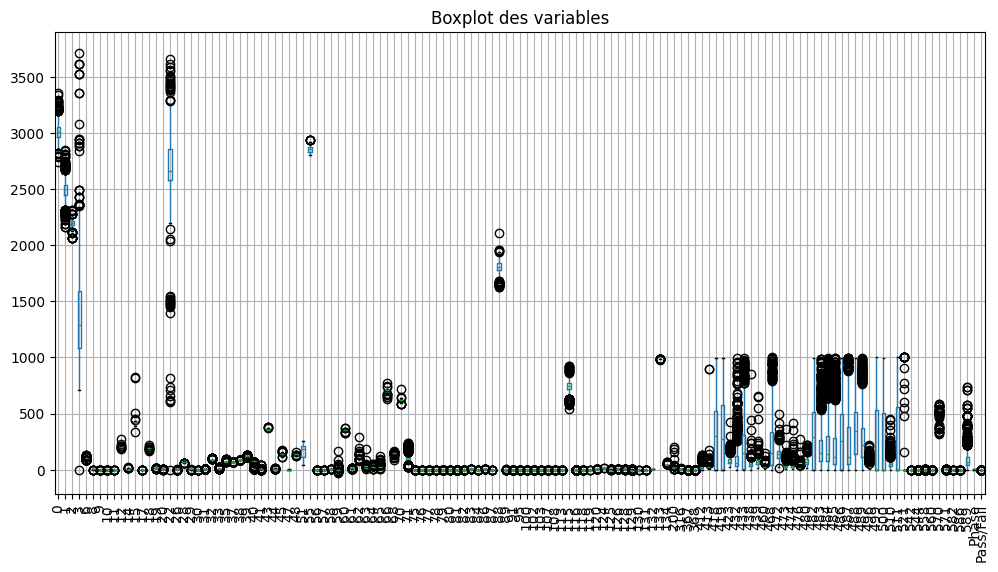

In [65]:
# Détection des valeurs aberrantes avec boxplot
plt.figure(figsize=(12, 6))
df_cleaned_no_outliers.boxplot(rot=90)
plt.title("Boxplot des variables")
plt.show()

#### Retrait de valeur aberrante au dela de l'intervalle [-1250; 1250]

In [66]:
# Définir les seuils pour les valeurs aberrantes
upper_limit = 1250
lower_limit = -1250

# Identifier les colonnes contenant des valeurs aberrantes
columns_to_drop = []
for col in df_cleaned_no_outliers.columns:
    if (df_cleaned_no_outliers[col] > upper_limit).any() or (df_cleaned_no_outliers[col] < lower_limit).any():
        columns_to_drop.append(col)

# Supprimer les colonnes contenant des valeurs aberrantes
df_cleaned_no_outliers = df_cleaned_no_outliers.drop(columns=columns_to_drop)

# Afficher le DataFrame sans les colonnes avec des valeurs aberrantes
print(f" ({len(columns_to_drop)}) Colonnes supprimées : {columns_to_drop}")
print(f"DataFrame après suppression des colonnes :\n{df_cleaned_no_outliers.head()}")


 (7) Colonnes supprimées : ['0', '1', '2', '3', '22', '55', '88']
DataFrame après suppression des colonnes :
          6       8       9      10      11        12       14        15  \
1  102.3433  1.4966 -0.0005 -0.0148  0.9627  200.5470  10.1548  414.7347   
2   95.4878  1.4436  0.0041  0.0013  0.9615  202.0179   9.5157  416.7075   
3  104.2367  1.4882 -0.0124 -0.0033  0.9629  201.8482   9.6052  422.2894   
4  100.3967  1.5031 -0.0031 -0.0072  0.9569  201.9424  10.5661  420.5925   
5  100.3967  1.5287  0.0167  0.0055  0.9699  200.4720   8.6617  414.2426   

       17        18  ...     544     558     560       570     571     582  \
1  0.9701  191.2872  ...  0.0026  0.9634  0.0375  535.0164  2.4335  0.5019   
2  0.9674  192.7035  ...  0.0026  1.5021  0.1233  535.0245  2.0293  0.4958   
3  0.9687  192.1557  ...  0.0026  1.1613  0.2710  530.5682  2.0253  0.4990   
4  0.9735  191.6037  ...  0.0026  0.9778  0.0461  532.0155  2.0275  0.4800   
5  0.9747  191.2280  ...  0.0026  0.9469  0.

#### Affichage du nouveau boxplot

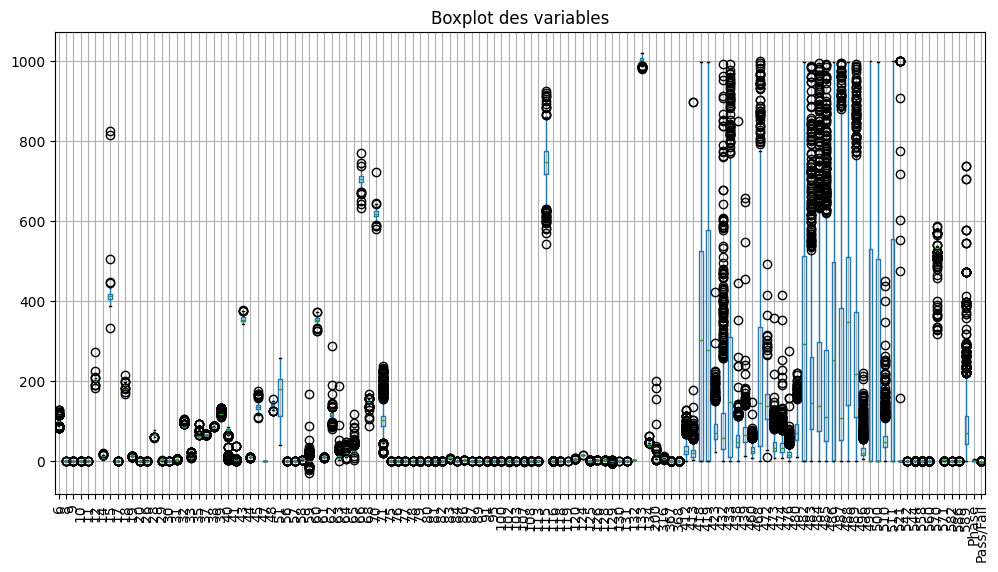

In [67]:
# Détection des valeurs aberrantes avec boxplot
plt.figure(figsize=(12, 6))
df_cleaned_no_outliers.boxplot(rot=90)
plt.title("Boxplot des variables")
plt.show()

#### Taille du nouveau dataframe

In [68]:
display(df_cleaned_no_outliers.shape)

(1393, 126)

#### Pourcentage Pass/Fail

In [69]:
pourcentage_target(df_cleaned_no_outliers)

Taille dataframe : 
(1393, 424)

Répartition des valeurs de 'Pass/Fail' en pourcentage:
-1: 92.89%
1: 7.11%


#### Visualisation de données

In [70]:
# 9. Visualisation des données
display(df_cleaned_no_outliers)

,6,8,9,10,11,12,14,15,17,18,...,544,558,560,570,571,582,586,589,Phase,Pass/Fail
1,102.3433,1.4966,-0.0005,-0.0148,0.9627,200.5470,10.1548,414.7347,0.9701,191.2872,...,0.0026,0.9634,0.0375,535.0164,2.4335,0.5019,0.0096,208.2045,3,-1
2,95.4878,1.4436,0.0041,0.0013,0.9615,202.0179,9.5157,416.7075,0.9674,192.7035,...,0.0026,1.5021,0.1233,535.0245,2.0293,0.4958,0.0584,82.8602,4,1
3,104.2367,1.4882,-0.0124,-0.0033,0.9629,201.8482,9.6052,422.2894,0.9687,192.1557,...,0.0026,1.1613,0.2710,530.5682,2.0253,0.4990,0.0202,73.8432,5,-1
4,100.3967,1.5031,-0.0031,-0.0072,0.9569,201.9424,10.5661,420.5925,0.9735,191.6037,...,0.0026,0.9778,0.0461,532.0155,2.0275,0.4800,0.0202,73.8432,2,-1
5,100.3967,1.5287,0.0167,0.0055,0.9699,200.4720,8.6617,414.2426,0.9747,191.2280,...,0.0026,0.9469,0.0604,534.2091,2.3236,0.4949,0.0342,44.0077,1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1537,104.5867,1.4522,-0.0039,-0.0075,0.9621,205.1896,9.8013,410.3304,0.9669,195.2844,...,0.0026,1.2430,0.1120,533.7318,2.0706,0.4942,0.0199,48.7045,4,-1
1539,85.4189,1.4167,0.0041,-0.0056,0.9696,197.3067,10.2410,413.4970,0.9732,188.2131,...,0.0030,1.0108,0.0435,569.9964,1.7961,0.4987,0.0237,47.3376,4,-1
1540,83.8767,1.4158,-0.0029,0.0000,0.9756,196.4876,8.7782,407.6755,0.9799,186.2299,...,0.0027,1.0690,0.0509,525.6127,2.0059,0.5011,0.0181,67.6676,0,-1
1541,114.5533,1.3966,-0.0057,-0.0169,0.9766,196.7066,11.5900,419.9885,0.9788,187.5690,...,0.0029,1.0108,0.0435,526.2355,2.1114,0.5021,0.0266,23.5979,4,-1


### Création des vecteurs X (features) et Y (target)

In [71]:
# 10. Création des vecteurs X (features) et Y (target)
X = df_cleaned_no_outliers.drop(columns=['Pass/Fail'])
Y = df_cleaned_no_outliers['Pass/Fail']

#### Vérification de la taille des vecteurs

In [72]:
print("Taille de X :", X.shape)
print("Taille de Y :", Y.shape)

Taille de X : (1393, 125)
Taille de Y : (1393,)


## Analyse des composantes principales (ACP)

### Standardisation des données

In [73]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#### Application de l'ACP

In [74]:
pca = PCA()
pca.fit(X_scaled)

PCA()

#### Variance expliquée par chaque composantes

In [75]:
explained_variance = pca.explained_variance_ratio_

#### Variance expliquée cumulée

In [76]:
cumulative_variance = np.cumsum(explained_variance)

#### Visualisation des variance expliquées cumulée

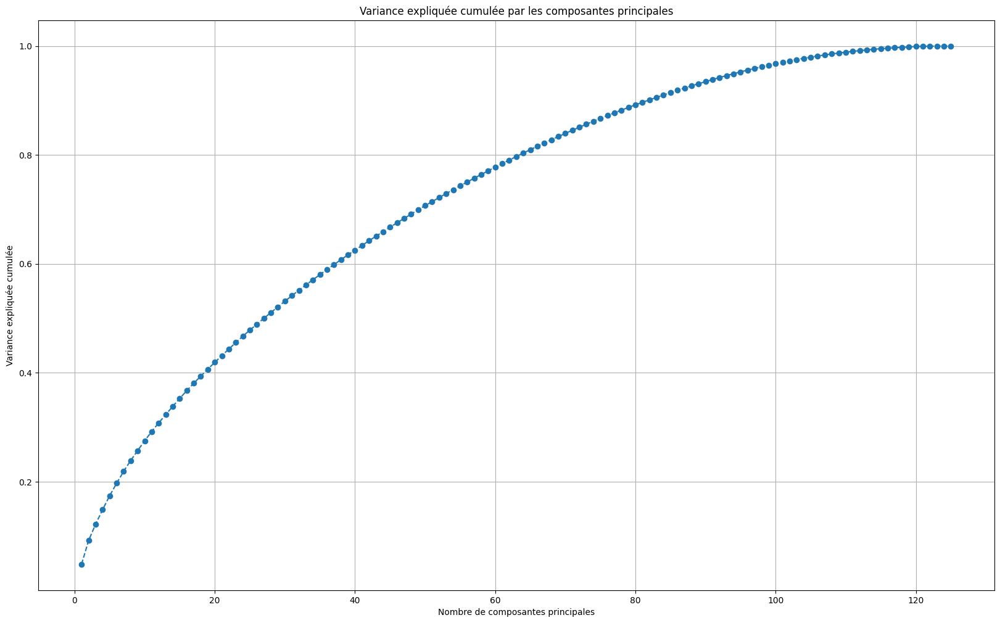

In [77]:
plt.figure(figsize=(20, 12))
plt.plot(range(1, len(explained_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Variance expliquée cumulée par les composantes principales')
plt.xlabel('Nombre de composantes principales')
plt.ylabel('Variance expliquée cumulée')
plt.grid(True)
plt.show()

#### Choisir le nombre de composantes pour conserver 95% de la variance expliquée

In [78]:
threshold = 0.95
n_components = np.argmax(cumulative_variance >= threshold) + 1
print(f"Nombre optimal de composantes pour {threshold*100}% de variance expliquée : {n_components}")

Nombre optimal de composantes pour 95.0% de variance expliquée : 95


#### Application de l'ACP avec le nombre de composantes optimal

In [79]:
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)

In [80]:
print("Taille de X :", X_pca.shape)
print("Taille de Y :", Y.shape)

Taille de X : (1393, 95)
Taille de Y : (1393,)


## Apprentissage et construction du modèle

#### Division des données en train/test

In [81]:
X_train, X_test, y_train, y_test = train_test_split(X_pca, Y, test_size=0.2, random_state=42)

## Test de modèles


Évaluation du modèle : DecisionTreeClassifier
Accuracy : 0.86
Précision : 0.09
Rappel : 0.11
Score F1 : 0.10
Matrice de confusion :
[[239  21]
 [ 17   2]]
Score en validation croisée : 0.88

Évaluation du modèle : RandomForestClassifier
Accuracy : 0.93
Précision : 0.00
Rappel : 0.00
Score F1 : 0.00
Matrice de confusion :
[[259   1]
 [ 19   0]]
Score en validation croisée : 0.93

Évaluation du modèle : AdaBoostClassifier
Accuracy : 0.92
Précision : 0.00
Rappel : 0.00
Score F1 : 0.00
Matrice de confusion :
[[256   4]
 [ 19   0]]
Score en validation croisée : 0.92

Évaluation du modèle : MLPClassifier
Accuracy : 0.94
Précision : 0.67
Rappel : 0.11
Score F1 : 0.18
Matrice de confusion :
[[259   1]
 [ 17   2]]
Score en validation croisée : 0.93


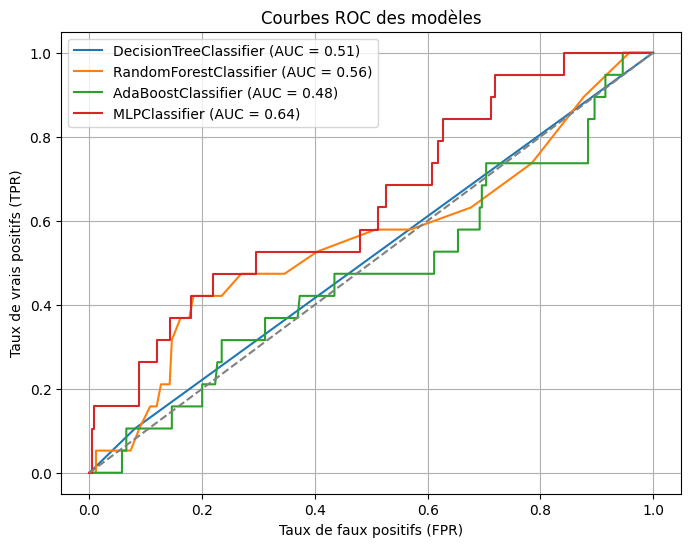

In [82]:
# Dictionnaire des modèles
models = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'ADAboost': AdaBoostClassifier(),
    'Neural Network': MLPClassifier(max_iter=1000)
}

# Évaluation des modèles
def evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Scores principaux
    print(f"\nÉvaluation du modèle : {model.__class__.__name__}")
    print(f"Accuracy : {accuracy_score(y_test, y_pred):.2f}")
    print(f"Précision : {precision_score(y_test, y_pred):.2f}")
    print(f"Rappel : {recall_score(y_test, y_pred):.2f}")
    print(f"Score F1 : {f1_score(y_test, y_pred):.2f}")

    # Matrice de confusion
    cm = confusion_matrix(y_test, y_pred)
    print(f"Matrice de confusion :\n{cm}")

    # Courbe ROC et AUC
    y_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{model.__class__.__name__} (AUC = {roc_auc:.2f})')

    # Validation croisée
    cv_score = cross_val_score(model, X_train, y_train, cv=5).mean()
    print(f"Score en validation croisée : {cv_score:.2f}")

plt.figure(figsize=(8, 6))
for model_name, model in models.items():
    evaluate_model(model, X_train, X_test, y_train, y_test)

# Graphique final
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title('Courbes ROC des modèles')
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.legend()
plt.grid(True)
plt.show()


## Optimisation et amélioration du modèle

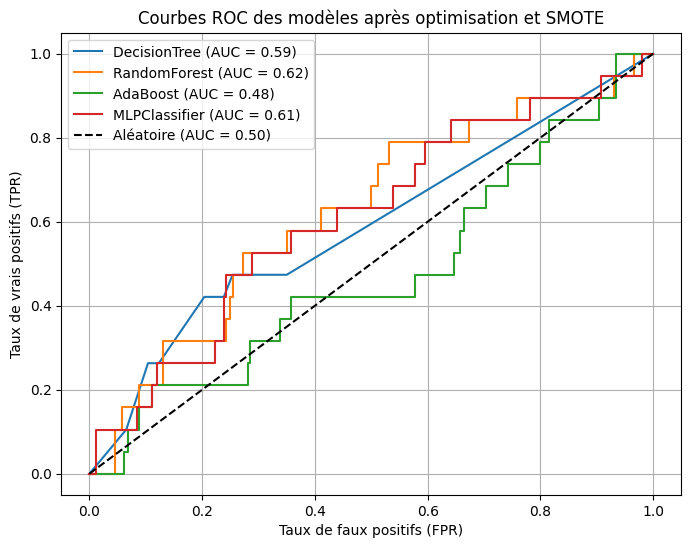

In [ ]:
# Application de SMOTE pour gérer le déséquilibre des classes
smote = SMOTE(random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)

# Définition des modèles avec GridSearchCV
param_grids = {
    'DecisionTree': (DecisionTreeClassifier(), {'max_depth': [3, 5, 10], 'min_samples_split': [2, 5, 10]}),
    'RandomForest': (RandomForestClassifier(), {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 10]}),
    'AdaBoost': (AdaBoostClassifier(), {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}),
    'MLPClassifier': (MLPClassifier(max_iter=500), {'hidden_layer_sizes': [(50,), (100,), (100, 50)], 'alpha': [0.0001, 0.001, 0.01]})
}

# Entraînement et évaluation
plt.figure(figsize=(8, 6))
for model_name, (model, params) in param_grids.items():
    grid_search = GridSearchCV(model, params, cv=5, scoring='roc_auc')
    grid_search.fit(X_train_sm, y_train_sm)

    best_model = grid_search.best_estimator_
    y_pred_proba = best_model.predict_proba(X_test)[:, 1]

    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

# Courbe de référence (aléatoire)
plt.plot([0, 1], [0, 1], 'k--', label='Aléatoire (AUC = 0.50)')
plt.title('Courbes ROC des modèles après optimisation et SMOTE')
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.legend()
plt.grid(True)
plt.show()


Évaluation du modèle : DecisionTreeClassifier
Accuracy : 0.75
Précision : 0.10
Rappel : 0.32
Score F1 : 0.15
Matrice de confusion :
[[204  56]
 [ 13   6]]
Score en validation croisée : 0.83

Évaluation du modèle : RandomForestClassifier
Accuracy : 0.89
Précision : 0.00
Rappel : 0.00
Score F1 : 0.00
Matrice de confusion :
[[248  12]
 [ 19   0]]
Score en validation croisée : 0.97

Évaluation du modèle : AdaBoostClassifier
Accuracy : 0.78
Précision : 0.08
Rappel : 0.21
Score F1 : 0.11
Matrice de confusion :
[[213  47]
 [ 15   4]]
Score en validation croisée : 0.86

Évaluation du modèle : MLPClassifier
Accuracy : 0.89
Précision : 0.08
Rappel : 0.05
Score F1 : 0.06
Matrice de confusion :
[[248  12]
 [ 18   1]]
Score en validation croisée : 0.97


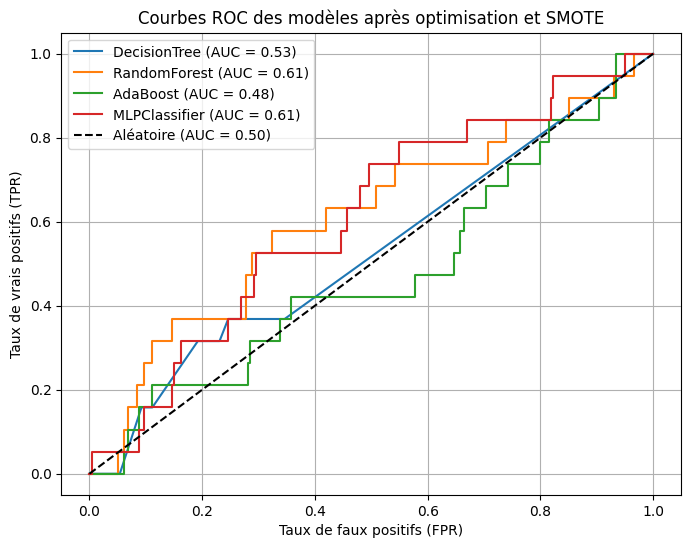

In [84]:
# Fonction d'évaluation améliorée
def evaluate_model(model, X_train, X_test, y_train, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Scores principaux
    print(f"\nÉvaluation du modèle : {model.__class__.__name__}")
    print(f"Accuracy : {accuracy_score(y_test, y_pred):.2f}")
    print(f"Précision : {precision_score(y_test, y_pred, zero_division=0):.2f}")
    print(f"Rappel : {recall_score(y_test, y_pred):.2f}")
    print(f"Score F1 : {f1_score(y_test, y_pred):.2f}")

    # Matrice de confusion
    cm = confusion_matrix(y_test, y_pred)
    print(f"Matrice de confusion :\n{cm}")

    # Score en validation croisée
    cv_score = cross_val_score(model, X_train, y_train, cv=5).mean()
    print(f"Score en validation croisée : {cv_score:.2f}")

# Application de SMOTE pour gérer le déséquilibre des classes
smote = SMOTE(random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)

# Définition des modèles avec GridSearchCV
param_grids = {
    'DecisionTree': (DecisionTreeClassifier(), {'max_depth': [3, 5, 10], 'min_samples_split': [2, 5, 10]}),
    'RandomForest': (RandomForestClassifier(), {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 10]}),
    'AdaBoost': (AdaBoostClassifier(), {'n_estimators': [50, 100, 200], 'learning_rate': [0.01, 0.1, 1]}),
    'MLPClassifier': (MLPClassifier(max_iter=500), {'hidden_layer_sizes': [(50,), (100,), (100, 50)], 'alpha': [0.0001, 0.001, 0.01]})
}

# Entraînement et évaluation des modèles
plt.figure(figsize=(8, 6))
for model_name, (model, params) in param_grids.items():
    grid_search = GridSearchCV(model, params, cv=5, scoring='roc_auc')
    grid_search.fit(X_train_sm, y_train_sm)

    best_model = grid_search.best_estimator_
    evaluate_model(best_model, X_train_sm, X_test, y_train_sm, y_test)  # Évaluation détaillée

    # Courbe ROC et AUC
    y_pred_proba = best_model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

# Courbe de référence (aléatoire)
plt.plot([0, 1], [0, 1], 'k--', label='Aléatoire (AUC = 0.50)')
plt.title('Courbes ROC des modèles après optimisation et SMOTE')
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.legend()
plt.grid(True)
plt.show()


#### Correction du déséquilibre


Évaluation du modèle : DecisionTreeClassifier
Accuracy : 0.76
Précision : 0.10
Rappel : 0.32
Score F1 : 0.15
Matrice de confusion :
[[206  54]
 [ 13   6]]
Score en validation croisée : 0.83

Évaluation du modèle : RandomForestClassifier
Accuracy : 0.91
Précision : 0.00
Rappel : 0.00
Score F1 : 0.00
Matrice de confusion :
[[253   7]
 [ 19   0]]
Score en validation croisée : 0.98

Évaluation du modèle : AdaBoostClassifier
Accuracy : 0.78
Précision : 0.08
Rappel : 0.21
Score F1 : 0.11
Matrice de confusion :
[[213  47]
 [ 15   4]]
Score en validation croisée : 0.86

Évaluation du modèle : MLPClassifier
Accuracy : 0.90
Précision : 0.09
Rappel : 0.05
Score F1 : 0.07
Matrice de confusion :
[[250  10]
 [ 18   1]]
Score en validation croisée : 0.98


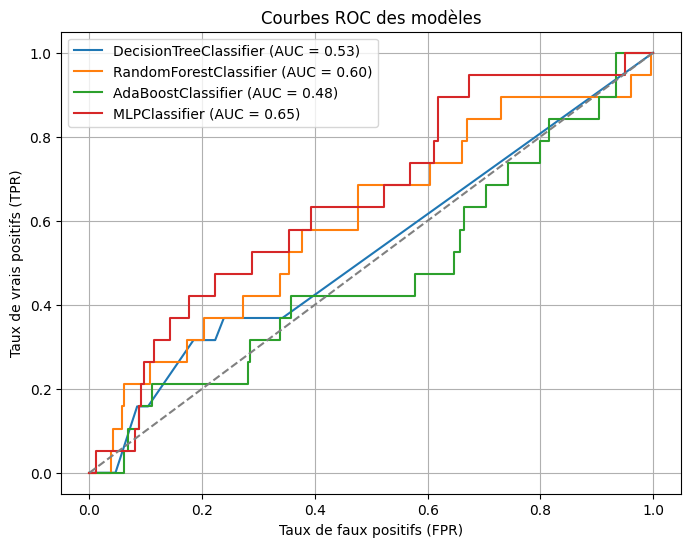


Hyperparamètres optimaux trouvés :
DecisionTreeClassifier : {'max_depth': 10, 'min_samples_split': 10}
RandomForestClassifier : {'max_depth': 10, 'n_estimators': 200}
AdaBoostClassifier : {'n_estimators': 200}
MLPClassifier : {'hidden_layer_sizes': (100,), 'max_iter': 1000}


In [85]:
# Correction du déséquilibre avec SMOTE
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

# Dictionnaire des modèles et hyperparamètres
param_grid = {
    'Decision Tree': {'max_depth': [3, 5, 10], 'min_samples_split': [2, 5, 10]},
    'Random Forest': {'n_estimators': [50, 100, 200], 'max_depth': [3, 5, 10]},
    'ADAboost': {'n_estimators': [50, 100, 200]},
    'Neural Network': {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'max_iter': [500, 1000]}
}

models = {
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'ADAboost': AdaBoostClassifier(),
    'Neural Network': MLPClassifier()
}

optimal_params = {}  # Dictionnaire pour stocker les meilleurs paramètres

# Évaluation des modèles
def evaluate_model(model, param_grid, X_train, X_test, y_train, y_test):
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='roc_auc')
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    optimal_params[model.__class__.__name__] = grid_search.best_params_

    y_pred = best_model.predict(X_test)

    # Scores principaux
    print(f"\nÉvaluation du modèle : {model.__class__.__name__}")
    print(f"Accuracy : {accuracy_score(y_test, y_pred):.2f}")
    print(f"Précision : {precision_score(y_test, y_pred):.2f}")
    print(f"Rappel : {recall_score(y_test, y_pred):.2f}")
    print(f"Score F1 : {f1_score(y_test, y_pred):.2f}")

    # Matrice de confusion
    cm = confusion_matrix(y_test, y_pred)
    print(f"Matrice de confusion :\n{cm}")

    # Courbe ROC et AUC
    y_proba = best_model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{model.__class__.__name__} (AUC = {roc_auc:.2f})')

    # Validation croisée
    cv_score = cross_val_score(best_model, X_train, y_train, cv=5).mean()
    print(f"Score en validation croisée : {cv_score:.2f}")

plt.figure(figsize=(8, 6))
for model_name, model in models.items():
    evaluate_model(model, param_grid[model_name], X_train, X_test, y_train, y_test)

# Graphique final
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.title('Courbes ROC des modèles')
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.legend()
plt.grid(True)
plt.show()

# Affichage des hyperparamètres optimaux
print("\nHyperparamètres optimaux trouvés :")
for model, params in optimal_params.items():
    print(f"{model} : {params}")


### Suréchantillonnage et comparaison de performances

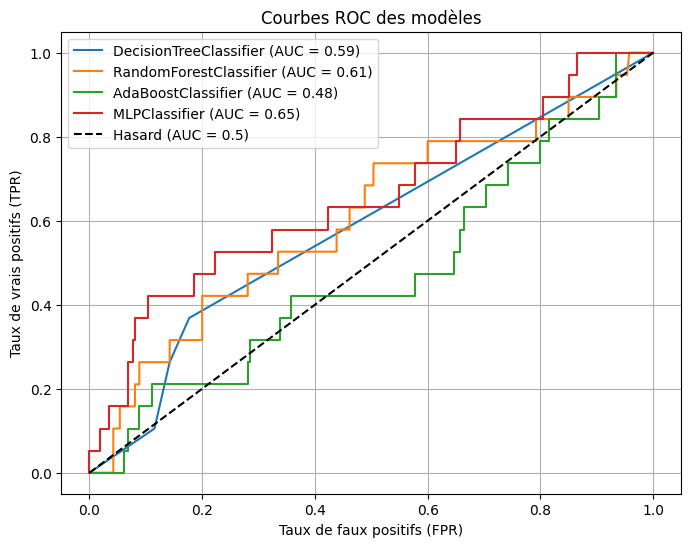

Hyperparamètres optimaux :
DecisionTreeClassifier : {'max_depth': 20}
RandomForestClassifier : {'max_depth': 20, 'n_estimators': 300}
AdaBoostClassifier : {'n_estimators': 200}
MLPClassifier : {'alpha': 0.0001, 'hidden_layer_sizes': (50,)}


In [86]:
# Suréchantillonnage avec SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Suréchantillonnage avec ADASYN
adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Liste des modèles et de leurs hyperparamètres
models = {
    'DecisionTreeClassifier': GridSearchCV(DecisionTreeClassifier(), {'max_depth': [3, 5, 10, 20]}, cv=5),
    'RandomForestClassifier': GridSearchCV(RandomForestClassifier(), {'n_estimators': [50, 100, 200, 300], 'max_depth': [5, 10, 20]}, cv=5),
    'AdaBoostClassifier': GridSearchCV(AdaBoostClassifier(), {'n_estimators': [50, 100, 200]}, cv=5),
    'MLPClassifier': GridSearchCV(MLPClassifier(max_iter=1000), {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'alpha': [0.0001, 0.001, 0.01]}, cv=5)
}

# Entraînement et évaluation des modèles
plt.figure(figsize=(8, 6))
for name, model in models.items():
    # Entraînement sur les données avec SMOTE
    model.fit(X_train_smote, y_train_smote)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Courbe ROC
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Hasard (AUC = 0.5)')
plt.title('Courbes ROC des modèles')
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.legend()
plt.grid(True)
plt.show()

# Affichage des hyperparamètres optimaux
display_params = {name: model.best_params_ for name, model in models.items()}
print("Hyperparamètres optimaux :")
for model, params in display_params.items():
    print(f"{model} : {params}")


### Deuxième test

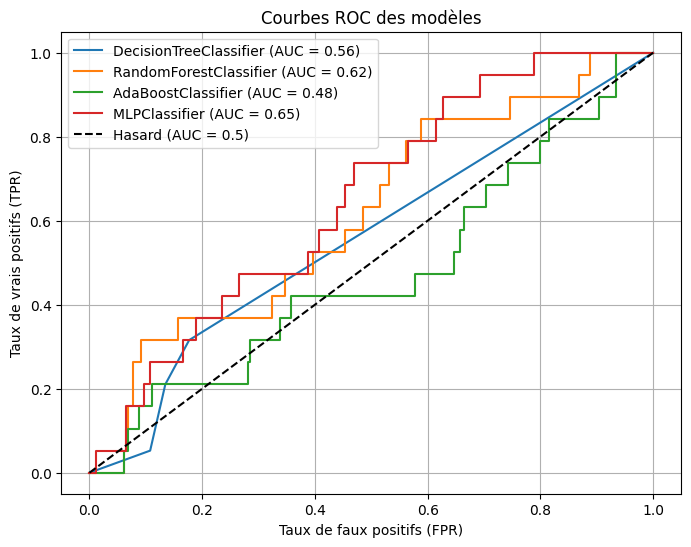

Hyperparamètres optimaux :
DecisionTreeClassifier : {'max_depth': 20}
RandomForestClassifier : {'max_depth': 20, 'n_estimators': 200}
AdaBoostClassifier : {'n_estimators': 200}
MLPClassifier : {'alpha': 0.001, 'hidden_layer_sizes': (100,)}


In [87]:
# Suréchantillonnage avec SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Suréchantillonnage avec ADASYN
adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Liste des modèles et de leurs hyperparamètres
models = {
    'DecisionTreeClassifier': GridSearchCV(DecisionTreeClassifier(), {'max_depth': [3, 5, 10, 20]}, cv=5),
    'RandomForestClassifier': GridSearchCV(RandomForestClassifier(), {'n_estimators': [50, 100, 200, 300], 'max_depth': [5, 10, 20]}, cv=5),
    'AdaBoostClassifier': GridSearchCV(AdaBoostClassifier(), {'n_estimators': [50, 100, 200]}, cv=5),
    'MLPClassifier': GridSearchCV(MLPClassifier(max_iter=1000), {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'alpha': [0.0001, 0.001, 0.01]}, cv=5)
}

# Entraînement et évaluation des modèles
plt.figure(figsize=(8, 6))
for name, model in models.items():
    # Entraînement sur les données avec SMOTE
    model.fit(X_train_smote, y_train_smote)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Courbe ROC
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Hasard (AUC = 0.5)')
plt.title('Courbes ROC des modèles')
plt.xlabel('Taux de faux positifs (FPR)')
plt.ylabel('Taux de vrais positifs (TPR)')
plt.legend()
plt.grid(True)
plt.show()

# Affichage des hyperparamètres optimaux
display_params = {name: model.best_params_ for name, model in models.items()}
print("Hyperparamètres optimaux :")
for model, params in display_params.items():
    print(f"{model} : {params}")


### Comparaison des performances avant et après échantillonnage

In [88]:
# Suréchantillonnage avec SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Suréchantillonnage avec ADASYN
adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Liste des modèles et de leurs hyperparamètres
models = {
    'DecisionTreeClassifier': GridSearchCV(DecisionTreeClassifier(), {'max_depth': [3, 5, 10, 20]}, cv=5),
    'RandomForestClassifier': GridSearchCV(RandomForestClassifier(), {'n_estimators': [50, 100, 200, 300], 'max_depth': [5, 10, 20]}, cv=5),
    'AdaBoostClassifier': GridSearchCV(AdaBoostClassifier(), {'n_estimators': [50, 100, 200]}, cv=5),
    'MLPClassifier': GridSearchCV(MLPClassifier(max_iter=1000), {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'alpha': [0.0001, 0.001, 0.01]}, cv=5)
}

# Fonction pour évaluer les modèles
def evaluate_models(X_train, y_train, label):
    results = {}
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        results[name] = accuracy
    return results

# Évaluation des modèles
performance_original = evaluate_models(X_train, y_train, 'Original')
performance_smote = evaluate_models(X_train_smote, y_train_smote, 'SMOTE')
performance_adasyn = evaluate_models(X_train_adasyn, y_train_adasyn, 'ADASYN')

# Affichage des résultats de comparaison
print("Comparaison des performances des modèles :")
print("\nOriginal :", performance_original)
print("\nSMOTE :", performance_smote)
print("\nADASYN :", performance_adasyn)

# Affichage des hyperparamètres optimaux
display_params = {name: model.best_params_ for name, model in models.items()}
print("\nHyperparamètres optimaux :")
for model, params in display_params.items():
    print(f"{model} : {params}")


Comparaison des performances des modèles :

Original : {'DecisionTreeClassifier': 0.7670250896057348, 'RandomForestClassifier': 0.9247311827956989, 'AdaBoostClassifier': 0.7777777777777778, 'MLPClassifier': 0.9068100358422939}

SMOTE : {'DecisionTreeClassifier': 0.7741935483870968, 'RandomForestClassifier': 0.921146953405018, 'AdaBoostClassifier': 0.7777777777777778, 'MLPClassifier': 0.9068100358422939}

ADASYN : {'DecisionTreeClassifier': 0.7706093189964157, 'RandomForestClassifier': 0.9247311827956989, 'AdaBoostClassifier': 0.7777777777777778, 'MLPClassifier': 0.9068100358422939}

Hyperparamètres optimaux :
DecisionTreeClassifier : {'max_depth': 20}
RandomForestClassifier : {'max_depth': 20, 'n_estimators': 300}
AdaBoostClassifier : {'n_estimators': 200}
MLPClassifier : {'alpha': 0.0001, 'hidden_layer_sizes': (100,)}


### Affichage graphique de la comparaison avant et après surechantillonnage

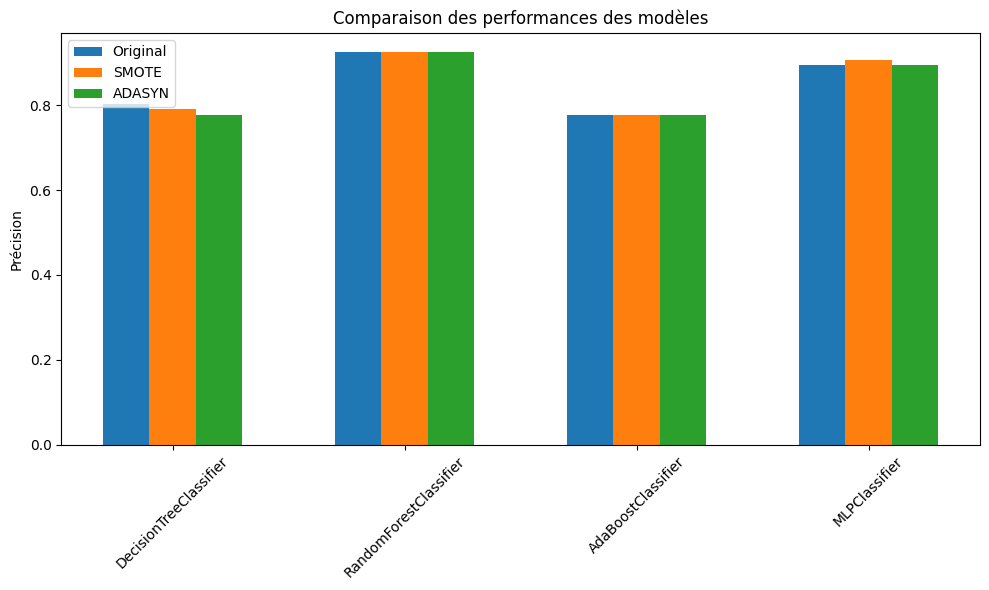


Hyperparamètres optimaux :
DecisionTreeClassifier : {'max_depth': 20}
RandomForestClassifier : {'max_depth': 20, 'n_estimators': 300}
AdaBoostClassifier : {'n_estimators': 200}
MLPClassifier : {'alpha': 0.0001, 'hidden_layer_sizes': (100,)}


In [89]:
# Suréchantillonnage avec SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Suréchantillonnage avec ADASYN
adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Liste des modèles et de leurs hyperparamètres
models = {
    'DecisionTreeClassifier': GridSearchCV(DecisionTreeClassifier(), {'max_depth': [3, 5, 10, 20]}, cv=5),
    'RandomForestClassifier': GridSearchCV(RandomForestClassifier(), {'n_estimators': [50, 100, 200, 300], 'max_depth': [5, 10, 20]}, cv=5),
    'AdaBoostClassifier': GridSearchCV(AdaBoostClassifier(), {'n_estimators': [50, 100, 200]}, cv=5),
    'MLPClassifier': GridSearchCV(MLPClassifier(max_iter=1000), {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'alpha': [0.0001, 0.001, 0.01]}, cv=5)
}

# Fonction pour évaluer les modèles
def evaluate_models(X_train, y_train, label):
    results = {}
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        results[name] = accuracy
    return results

# Évaluation des modèles
performance_original = evaluate_models(X_train, y_train, 'Original')
performance_smote = evaluate_models(X_train_smote, y_train_smote, 'SMOTE')
performance_adasyn = evaluate_models(X_train_adasyn, y_train_adasyn, 'ADASYN')

# Affichage graphique des comparaisons
labels = list(performance_original.keys())
original_values = list(performance_original.values())
smote_values = list(performance_smote.values())
adasyn_values = list(performance_adasyn.values())

x = np.arange(len(labels))
plt.figure(figsize=(10, 6))
plt.bar(x - 0.2, original_values, width=0.2, label='Original')
plt.bar(x, smote_values, width=0.2, label='SMOTE')
plt.bar(x + 0.2, adasyn_values, width=0.2, label='ADASYN')

plt.xticks(x, labels, rotation=45)
plt.ylabel('Précision')
plt.title('Comparaison des performances des modèles')
plt.legend()
plt.tight_layout()
plt.show()

# Affichage des hyperparamètres optimaux
display_params = {name: model.best_params_ for name, model in models.items()}
print("\nHyperparamètres optimaux :")
for model, params in display_params.items():
    print(f"{model} : {params}")


### Courbe ROC et comparaison des modèles

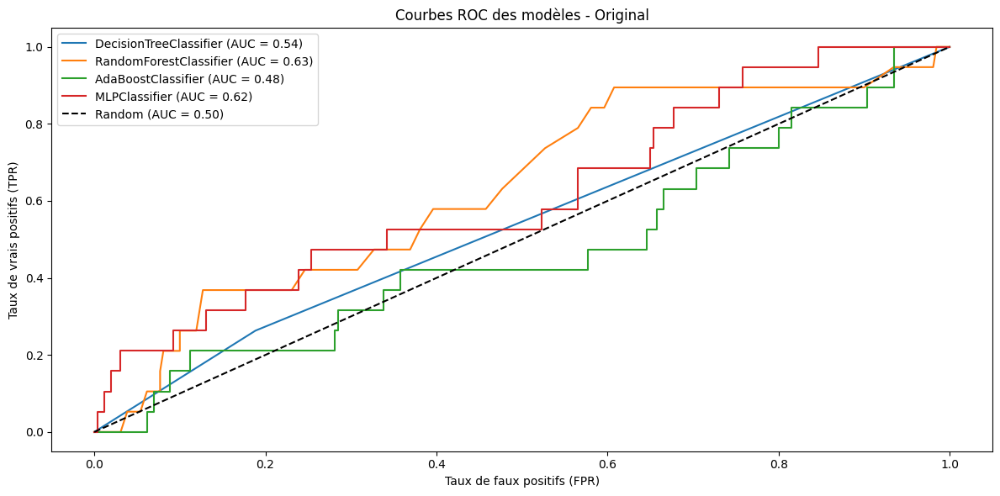

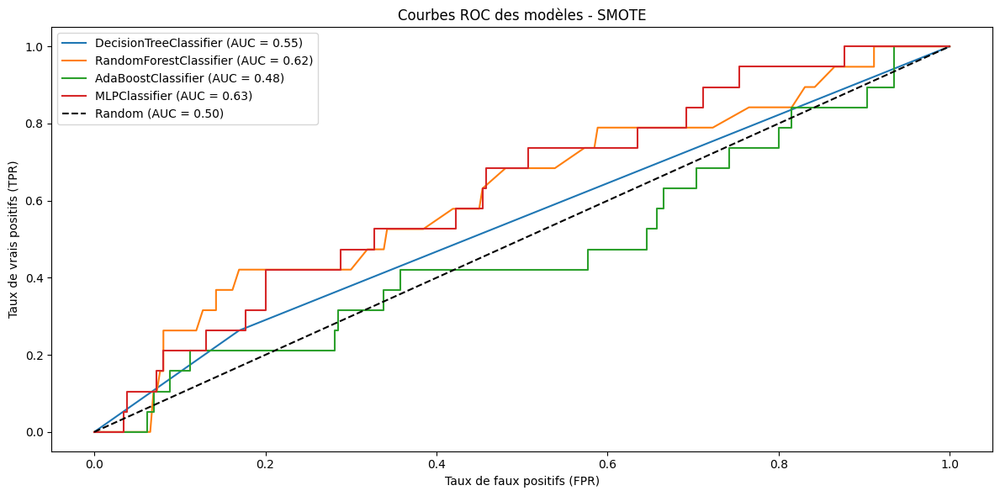

In [ ]:
# Suréchantillonnage avec SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Suréchantillonnage avec ADASYN
adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Liste des modèles et de leurs hyperparamètres
models = {
    'DecisionTreeClassifier': GridSearchCV(DecisionTreeClassifier(), {'max_depth': [3, 5, 10, None]}, cv=5),
    'RandomForestClassifier': GridSearchCV(RandomForestClassifier(), {'n_estimators': [50, 100, 200, 300], 'max_depth': [5, 10, None]}, cv=5),
    'AdaBoostClassifier': GridSearchCV(AdaBoostClassifier(), {'n_estimators': [50, 100, 200]}, cv=5),
    'MLPClassifier': GridSearchCV(MLPClassifier(max_iter=1000), {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'alpha': [0.0001, 0.001, 0.01]}, cv=5)
}

# Fonction pour évaluer les modèles
def evaluate_models(X_train, y_train, label):
    results = {}
    plt.figure(figsize=(12, 6))
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        results[name] = accuracy

        # Courbe ROC
        y_prob = model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.50)')
    plt.xlabel('Taux de faux positifs (FPR)')
    plt.ylabel('Taux de vrais positifs (TPR)')
    plt.title(f'Courbes ROC des modèles - {label}')
    plt.legend()
    plt.tight_layout()
    plt.show()

    return results

# Évaluation des modèles
performance_original = evaluate_models(X_train, y_train, 'Original')
performance_smote = evaluate_models(X_train_smote, y_train_smote, 'SMOTE')
performance_adasyn = evaluate_models(X_train_adasyn, y_train_adasyn, 'ADASYN')

# Affichage graphique des comparaisons
labels = list(performance_original.keys())
original_values = list(performance_original.values())
smote_values = list(performance_smote.values())
adasyn_values = list(performance_adasyn.values())

x = np.arange(len(labels))
plt.figure(figsize=(10, 6))
plt.bar(x - 0.2, original_values, width=0.2, label='Original')
plt.bar(x, smote_values, width=0.2, label='SMOTE')
plt.bar(x + 0.2, adasyn_values, width=0.2, label='ADASYN')

plt.xticks(x, labels, rotation=45)
plt.ylabel('Précision')
plt.title('Comparaison des performances des modèles')
plt.legend()
plt.tight_layout()
plt.show()

# Affichage des hyperparamètres optimaux
display_params = {name: model.best_params_ for name, model in models.items()}
print("\nHyperparamètres optimaux :")
for model, params in display_params.items():
    print(f"{model} : {params}")


### Exportation du meilleur modèle

In [ ]:
# Suréchantillonnage avec SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Suréchantillonnage avec ADASYN
adasyn = ADASYN(random_state=42)
X_train_adasyn, y_train_adasyn = adasyn.fit_resample(X_train, y_train)

# Liste des modèles et de leurs hyperparamètres
models = {
    'DecisionTreeClassifier': GridSearchCV(DecisionTreeClassifier(), {'max_depth': [3, 5, 10, None]}, cv=5),
    'RandomForestClassifier': GridSearchCV(RandomForestClassifier(), {'n_estimators': [50, 100, 200, 300], 'max_depth': [5, 10, None]}, cv=5),
    'AdaBoostClassifier': GridSearchCV(AdaBoostClassifier(), {'n_estimators': [50, 100, 200]}, cv=5),
    'MLPClassifier': GridSearchCV(MLPClassifier(max_iter=1000), {'hidden_layer_sizes': [(50,), (100,), (50, 50)], 'alpha': [0.0001, 0.001, 0.01]}, cv=5)
}

# Fonction pour évaluer les modèles
def evaluate_models(X_train, y_train, label):
    results = {}
    plt.figure(figsize=(12, 6))
    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        results[name] = accuracy

        # Courbe ROC
        y_prob = model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{name} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', label='Random (AUC = 0.50)')
    plt.xlabel('Taux de faux positifs (FPR)')
    plt.ylabel('Taux de vrais positifs (TPR)')
    plt.title(f'Courbes ROC des modèles - {label}')
    plt.legend()
    plt.tight_layout()
    plt.show()

        # Sauvegarde du meilleur modèle
    if best_model:
        best_model_filename = f"best_model_{label}.pkl"
        joblib.dump(best_model, best_model_filename)
        print(f"Modèle le plus performant enregistré sous : {best_model_filename}")

    return results

# Évaluation des modèles
performance_original = evaluate_models(X_train, y_train, 'Original')
performance_smote = evaluate_models(X_train_smote, y_train_smote, 'SMOTE')
performance_adasyn = evaluate_models(X_train_adasyn, y_train_adasyn, 'ADASYN')

# Affichage graphique des comparaisons
labels = list(performance_original.keys())
original_values = list(performance_original.values())
smote_values = list(performance_smote.values())
adasyn_values = list(performance_adasyn.values())

x = np.arange(len(labels))
plt.figure(figsize=(10, 6))
plt.bar(x - 0.2, original_values, width=0.2, label='Original')
plt.bar(x, smote_values, width=0.2, label='SMOTE')
plt.bar(x + 0.2, adasyn_values, width=0.2, label='ADASYN')

plt.xticks(x, labels, rotation=45)
plt.ylabel('Précision')
plt.title('Comparaison des performances des modèles')
plt.legend()
plt.tight_layout()
plt.show()

# Affichage des hyperparamètres optimaux
display_params = {name: model.best_params_ for name, model in models.items()}
print("\nHyperparamètres optimaux :")
for model, params in display_params.items():
    print(f"{model} : {params}")


# Sauvegarde du standardiseur et du PCA

In [ ]:
# Sauvegarde du StandardScaler
joblib.dump(scaler, "scaler.pkl")
print("Scaler sauvegardé sous : scaler.pkl")

# Sauvegarde du modèle PCA
joblib.dump(pca, "pca.pkl")
print("Modèle PCA sauvegardé sous : pca.pkl")